# Query about the Master Bias

- work with Weakly_2023_35
- use jupyter kernel LSST
- author : Sylvie Dagoret-Campagne
- affiliation : IJCLab
- creation date : 2023/09/15
- update : 2023/09/18

https://pipelines.lsst.io/middleware/faq.html

In [1]:
import os
import matplotlib.pyplot as plt
import re

import numpy as np
import pandas as pd
%matplotlib inline
from matplotlib.colors import LogNorm

from mpl_toolkits.axes_grid1 import make_axes_locatable

import matplotlib.ticker                         # here's where the formatter is
from matplotlib.ticker import (MultipleLocator, FormatStrFormatter,
                               AutoMinorLocator)

from astropy.io import fits
from astropy.time import Time

In [2]:
# LSST Display
import lsst.afw.display as afwDisplay
afwDisplay.setDefaultBackend('matplotlib')

In [3]:
# Butler
import lsst.daf.butler as dafButler
from lsst.daf.butler import CollectionType
#from lsst.daf.butler import CollectionTypes

In [4]:
#repo = "/sdf/group/rubin/repo/main" # repo/main
repo="/sdf/group/rubin/repo/oga/"  # /repo/embargo
butler = dafButler.Butler(repo)
registry = butler.registry

# Registry

- Examine the info from registry

In [5]:
butler.registry.dimensions.getDatabaseElements()

NamedValueSet({DatabaseDimension(band), DatabaseDimension(detector), DatabaseDimension(physical_filter), DatabaseDimension(subfilter), DatabaseDimension(tract), DatabaseDimension(visit_system), DatabaseDimension(exposure), DatabaseDimension(patch), DatabaseDimension(visit), DatabaseDimensionCombination(visit_definition), DatabaseDimensionCombination(visit_detector_region), DatabaseDimensionCombination(visit_system_membership)})

In [6]:
print(butler.registry.dimensions["exposure"].RecordClass.fields)

exposure: 
  instrument: str
  id: int
  physical_filter: str
  obs_id: str
  exposure_time: float
  dark_time: float
  observation_type: str
  observation_reason: str
  day_obs: int
  seq_num: int
  seq_start: int
  seq_end: int
  group_name: str
  group_id: int
  target_name: str
  science_program: str
  tracking_ra: float
  tracking_dec: float
  sky_angle: float
  azimuth: float
  zenith_angle: float
  has_simulated: bool
  timespan: lsst.daf.butler.Timespan


In [7]:
print(butler.registry.dimensions["visit"].RecordClass.fields)

visit: 
  instrument: str
  id: int
  physical_filter: str
  name: str
  day_obs: int
  seq_num: int
  exposure_time: float
  target_name: str
  observation_reason: str
  science_program: str
  azimuth: float
  zenith_angle: float
  region: lsst.sphgeom.Region
  timespan: lsst.daf.butler.Timespan


In [8]:
print(butler.registry.dimensions["physical_filter"].RecordClass.fields)

physical_filter: 
  instrument: str
  name: str
  band: str


In [9]:
print(butler.registry.dimensions["tract"].RecordClass.fields)

tract: 
  skymap: str
  id: int
  region: lsst.sphgeom.Region


## Search for all Calib collection available


In the following cell one get the list of flats available

In [10]:
CollectionType.CALIBRATION

<CollectionType.CALIBRATION: 4>

### Preliminary remark

A first remarks as one run pipetask:
    #/bin/sh

    # author : Sylvie Dagoret-Campagne
    # creation date 2023-09-15


    export DISPLAY=
  
    ## Activation

    source /sdf/group/rubin/sw/tag/w_2023_35/loadLSST.bash
    setup lsst_distrib -t w_2023_35
    source ~/notebooks/.user_setups

    export BUTLER_REPO="/sdf/group/rubin/repo/oga"

    butler query-dimension-records $BUTLER_REPO exposure --where "instrument='LATISS' AND exposure.day_obs=20230912 AND exposure.science_program='SITCOM-1001' AND physical_filter='empty~holo4_001' AND exposure.observation_type='science'"

    pipetask run -b /sdf/group/rubin/repo/oga -p /sdf/home/d/dagoret/repos/repos_w_2023_35/atmospec/pipelines/processStar_rotatedisp.yaml -i LATISS/raw/all,refcats,LATISS/calib -o u/dagoret/spectro/emptyholo4001noflat/runs_20230912 -d "exposure.day_obs=20230912 and instrument='LATISS' and exposure.science_program='SITCOM-1001' and exposure.observation_type='science' and physical_filter='empty~holo4_001'" 


   One see that we need to provide only two collections to pipetask: **LATISS/raw/all,LATISS/calib** that is all


### But if we want to know what is the list of available calibrations

- we nedd to run this stange butler registry

In [11]:
#expanded = list(
#    butler.registry.queryCollections(
#        repo,
#        flattenChains=True,
#        collectionTypes=(CollectionType.all - {CollectionType.CALIBRATION}),
#    )
#)

In [12]:
all_calibcollections = list(
    butler.registry.queryCollections(
        re.compile("LATISS/calib/.+"),
        collectionTypes={CollectionType.RUN},
    )
)

In [13]:
all_calibcollections

['LATISS/calib/DM-28636/curated/19700101T000000Z',
 'LATISS/calib/DM-28636/curated/20180101T000000Z',
 'LATISS/calib/DM-28636/unbounded',
 'LATISS/calib/DM-36484/biasGen.20221005a/20221006T000101Z',
 'LATISS/calib/DM-36484/verifyBias.20221005a/20221006T000747Z',
 'LATISS/calib/DM-36484/verifyBias.20221005a/20221006T213237Z',
 'LATISS/calib/DM-36484/darkGen.20221005a/20221006T222501Z',
 'LATISS/calib/DM-36484/darkGen.20221006a/20221006T222921Z',
 'LATISS/calib/DM-36484/verifyDark.20221006a/20221006T224403Z',
 'LATISS/calib/DM-36484/flatGen-SDSSr.20221006a/20221006T233657Z',
 'LATISS/calib/DM-36484/verifyFlat-SDSSr.20221006a/20221006T234341Z',
 'LATISS/calib/DM-36484/flatGen-SDSSg.20221006a/20221007T002703Z',
 'LATISS/calib/DM-36484/verifyFlat-SDSSg.20221006a/20221007T003418Z',
 'LATISS/calib/DM-36484/flatGen-SDSSi.20221006a/20221007T003732Z',
 'LATISS/calib/DM-36484/verifyFlat-SDSSi.20221006a/20221007T004423Z',
 'LATISS/calib/DM-36484/flatGen-SDSSiD.20221006a/20221007T004708Z',
 'LATISS

Note above we have many calibrations. But if we refer to command lines querys :

### Calibration command lines queries


```bash
/sdf/home/d/dagoret>butler query-collections /repo/embargo --chains=flatten --collection-type RUN --collection-type CHAINED --collection-type TAGGED LATISS/defaults
```

                  Name              Type

    ------------------------------- ----
    LATISS/raw/all                  RUN 
    LATISS/calib/DM-40082/unbounded RUN 
    refcats/DM-28636                RUN 
    refcats/DM-33444                RUN 
    skymaps                         RUN


If we do this other shell query we get other collections

```bash
REPO=/repo/embargo
butler query-collections $REPO LATISS/calib
                              Name                                  Type   

--------------------------------------------------------------- -----------

LATISS/calib                                                    CHAINED    
  LATISS/calib/DM-39505                                         CHAINED    
    LATISS/calib/DM-39505/crosstalk.20230602                    CALIBRATION
  LATISS/calib/DM-38946                                         CHAINED    
    LATISS/calib/DM-38946/noRGseq/bias.20230503                 CALIBRATION
    LATISS/calib/DM-38946/noRGseq/dark.20230503                 CALIBRATION
    LATISS/calib/DM-38946/noRGseq/flat-g.20230503               CALIBRATION
    LATISS/calib/DM-38946/noRGseq/flat-r.20230503               CALIBRATION
    LATISS/calib/DM-38946/noRGseq/flat-i.20230503               CALIBRATION
  u/czw/DM-37811/parOStest.20230202a/calib/flat-OG550.20230207a CALIBRATION
  u/czw/DM-37811/parOStest.20230202a/calib/flat-BG40.20230207a  CALIBRATION
  u/czw/DM-37811/parOStest.20230202a/calib/flat-SDSSr.20230203a CALIBRATION
  u/czw/DM-37811/parOStest.20230202a/calib/flat-SDSSg.20230203a CALIBRATION
  u/czw/DM-37811/parOStest.20230202a/calib/flat-SDSSi.20230202a CALIBRATION
  u/czw/DM-37811/parOStest.20230202a/calib/dark.20230202a       CALIBRATION
  u/czw/DM-37811/parOStest.20230202a/calib/bias.20230202a       CALIBRATION
  LATISS/calib/DM-37587/flat-BG40.20230113a                     CALIBRATION
  LATISS/calib/DM-37587/flat-OG550.20230113a                    CALIBRATION
  LATISS/calib/DM-37587/flat-SDSSr.20230113a                    CALIBRATION
  LATISS/calib/DM-36719                                         CHAINED    
    LATISS/calib/DM-36719/bias.20221107                         CALIBRATION
    LATISS/calib/DM-36719/dark.20221107                         CALIBRATION
    LATISS/calib/DM-36719/flat-SDSSi.20221107                   CALIBRATION
    LATISS/calib/DM-36719/flat-SDSSr.20221107                   CALIBRATION
    LATISS/calib/DM-36719/flat-SDSSg.20221107                   CALIBRATION
  LATISS/calib/DM-36484/bias.20221005a                          CALIBRATION
  LATISS/calib/DM-36484/dark.20221006a                          CALIBRATION
  LATISS/calib/DM-36484/flat-SDSSg.20221006a                    CALIBRATION
  LATISS/calib/DM-36484/flat-SDSSr.20221006a                    CALIBRATION
  LATISS/calib/DM-36484/flat-SDSSi.20221006a                    CALIBRATION
  u/czw/defects.20220608                                        CALIBRATION
  LATISS/calib/DM-33875                                         CALIBRATION
  u/czw/DM-28920/calib/bias.20210720                            CALIBRATION
  u/czw/DM-28920/calib/dark.20210720a                           CALIBRATION
  u/calib/DM-32209-20211013a-g                                  CALIBRATION
  u/calib/DM-32209-20211013a-felh                               CALIBRATION
  u/czw/DM-28920/calib/flat.20210720                            CALIBRATION
  u/czw/DM-28920/calib/defect.20210720a                         CALIBRATION
  LATISS/calib/DM-40082                                         CALIBRATION
  LATISS/calib/DM-40082/unbounded                               RUN
  ```


## Test the kind of Master Bias one get from Latiss/calib collection

In [14]:
# Of couse I know which exposure I am using
exposure_selected=2023021400335 #use an old exposure
#exposure_selected=2023070400269
#exposure_selected=2023072000235

In [15]:
bias_img = butler.get(
    "bias",
    instrument="LATISS", exposure=exposure_selected, detector=0,
    collections="LATISS/calib"
)

In [16]:
bias_md = bias_img.getMetadata()
MB_date= bias_md['CALIB_CREATION_DATE']
MB_time = bias_md['CALIB_CREATION_TIME']
print(f"Exposure {exposure_selected}, DATE for Master Bias",MB_date, MB_time)

Exposure 2023021400335, DATE for Master Bias 2023-02-02 16:00:20 PST


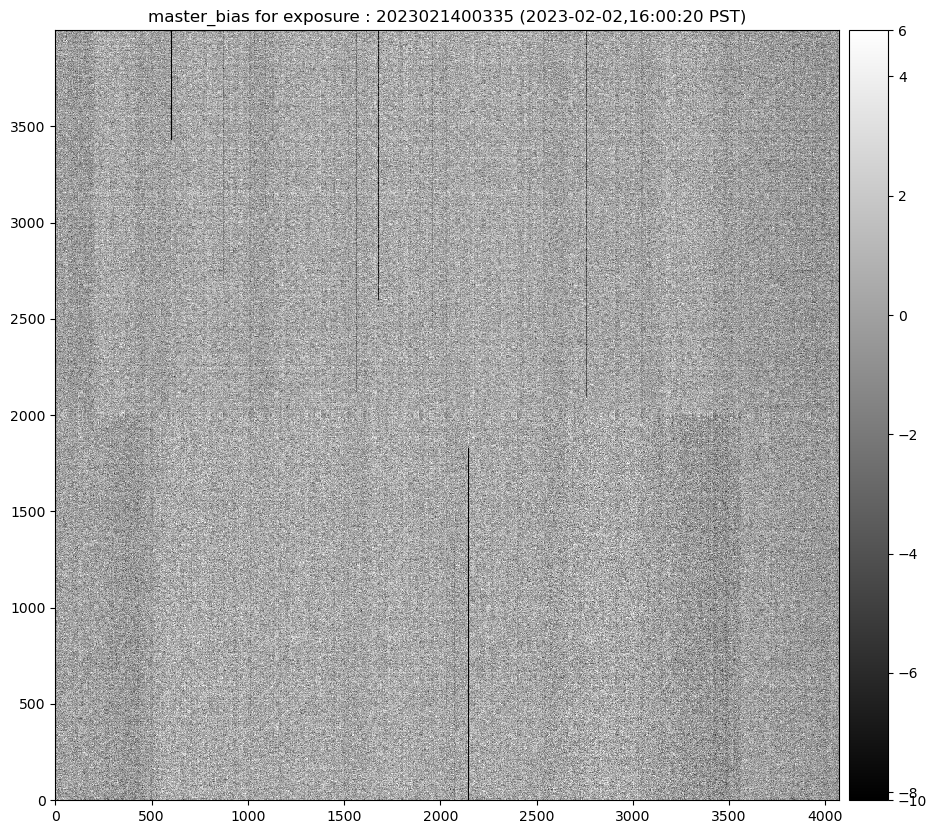

In [17]:
fig = plt.figure(figsize=(12,10))
afw_display = afwDisplay.Display(frame=fig)
afw_display.scale('linear', 'zscale',None)
title = f"master_bias for exposure : {exposure_selected} ({MB_date},{MB_time})"
afw_display.mtv(bias_img.image,title=title)

# Find the calibration in my PostISRCCD

In [18]:
#my_collection = "u/dagoret/spectro/collimatorholo4003noflat/runs_20230913"
#filterdisperser = "collimator~holo4_003"
#DATE=20230913

In [19]:
#my_collection = "u/dagoret/spectro/emptyholo4003noflat/runs_20230913"
#filterdisperser = "empty~holo4_003"
#DATE=20230913

In [20]:
#my_collection = "u/dagoret/spectro/emptyholo4001noflat/runs_20230913"
my_collection = 'u/dagoret/spectro/collimatorholo4003noflat/runs_20230914',
#filterdisperser = "empty~holo4_001"
filterdisperser = "collimator~holo4_003"

DATE=20230914

In [21]:
datasetRefs = registry.queryDatasets(datasetType='postISRCCD', collections=my_collection, where= "instrument='LATISS'")

In [22]:
all_dataId = []
all_postisrccd  = []
all_exposures = []
for i, ref in enumerate(datasetRefs):
   
    print(f"========({i})================datasetType = postISRCCD ============================================")
    print("fullId..................:",ref.dataId.full)
    print("exposure................:",ref.dataId["exposure"])
    print("band....................:",ref.dataId["band"])
    print("physical filter.........:",ref.dataId["physical_filter"])
    print("run.....................:",ref.run)
    the_exposure = ref.dataId["exposure"]
    the_day_obs = ref.dataId["exposure"]//100_000
    the_seq_num = ref.dataId["exposure"]- the_day_obs*100_000    
    the_dataId = {'day_obs': the_day_obs,'seq_num':the_seq_num,'detector':0}
    print(the_dataId)
    #spec       = butler.get('spectraction',the_dataId)
    postisrccd = butler.get('postISRCCD', exposure=the_exposure, detector=0, collections=my_collection, instrument='LATISS')
    all_dataId.append(the_dataId) 
    all_exposures.append(the_exposure)
    all_postisrccd.append(postisrccd)

========(0)================datasetType = postISRCCD ============================================
fullId..................: {band: 'white', instrument: 'LATISS', detector: 0, physical_filter: 'collimator~holo4_003', exposure: 2023091400120}
exposure................: 2023091400120
band....................: white
physical filter.........: collimator~holo4_003
run.....................: u/dagoret/spectro/collimatorholo4003noflat/runs_20230914/20230915T091136Z
{'day_obs': 20230914, 'seq_num': 120, 'detector': 0}
========(1)================datasetType = postISRCCD ============================================
fullId..................: {band: 'white', instrument: 'LATISS', detector: 0, physical_filter: 'collimator~holo4_003', exposure: 2023091400095}
exposure................: 2023091400095
band....................: white
physical filter.........: collimator~holo4_003
run.....................: u/dagoret/spectro/collimatorholo4003noflat/runs_20230914/20230915T091136Z
{'day_obs': 20230914, 'seq_nu

In [23]:
N = len(all_postisrccd)

In [24]:
for idx in range(N):
    my_postisrccd = all_postisrccd[idx]
    my_postisrccd_md = dict(my_postisrccd.getMetadata())
    print(f"==================={all_exposures[idx]}=======================")
    print(my_postisrccd_md['LSST CALIB DATE DEFECTS'])
    print(my_postisrccd_md['LSST CALIB UUID DEFECTS']) 
    print(my_postisrccd_md['LSST CALIB RUN DEFECTS'])


===================2023091400120=======================
2022-06-08 17:35:34
5bf77ea9-7838-4502-964a-6b3ee3c6127a
u/czw/calibX.20220608
===================2023091400095=======================
2022-06-08 17:35:34
5bf77ea9-7838-4502-964a-6b3ee3c6127a
u/czw/calibX.20220608
===================2023091400146=======================
2022-06-08 17:35:34
5bf77ea9-7838-4502-964a-6b3ee3c6127a
u/czw/calibX.20220608
===================2023091400121=======================
2022-06-08 17:35:34
5bf77ea9-7838-4502-964a-6b3ee3c6127a
u/czw/calibX.20220608
===================2023091400252=======================
2022-06-08 17:35:34
5bf77ea9-7838-4502-964a-6b3ee3c6127a
u/czw/calibX.20220608
===================2023091400227=======================
2022-06-08 17:35:34
5bf77ea9-7838-4502-964a-6b3ee3c6127a
u/czw/calibX.20220608
===================2023091400182=======================
2022-06-08 17:35:34
5bf77ea9-7838-4502-964a-6b3ee3c6127a
u/czw/calibX.20220608
===================2023091400253=======================

In [25]:
#my_postisrccd_md 

In [26]:
for idx in range(N):
    my_postisrccd = all_postisrccd[idx]
    my_postisrccd_md = dict(my_postisrccd.getMetadata())
    print(f"==================={all_exposures[idx]}=======================")
    print(my_postisrccd_md['LSST CALIB DATE BIAS'])
    print(my_postisrccd_md['LSST CALIB UUID BIAS']) 
    print(my_postisrccd_md['LSST CALIB RUN BIAS'])


===================2023091400120=======================
2023-04-28 14:13:20 PDT
e7ae8c95-535d-4259-9766-d668a255edf4
LATISS/calib/DM-38946/noRGseq/biasGen.20230428a/
===================2023091400095=======================
2023-04-28 14:13:20 PDT
e7ae8c95-535d-4259-9766-d668a255edf4
LATISS/calib/DM-38946/noRGseq/biasGen.20230428a/
===================2023091400146=======================
2023-04-28 14:13:20 PDT
e7ae8c95-535d-4259-9766-d668a255edf4
LATISS/calib/DM-38946/noRGseq/biasGen.20230428a/
===================2023091400121=======================
2023-04-28 14:13:20 PDT
e7ae8c95-535d-4259-9766-d668a255edf4
LATISS/calib/DM-38946/noRGseq/biasGen.20230428a/
===================2023091400252=======================
2023-04-28 14:13:20 PDT
e7ae8c95-535d-4259-9766-d668a255edf4
LATISS/calib/DM-38946/noRGseq/biasGen.20230428a/
===================2023091400227=======================
2023-04-28 14:13:20 PDT
e7ae8c95-535d-4259-9766-d668a255edf4
LATISS/calib/DM-38946/noRGseq/biasGen.20230428a/
====

# Compare the Master Bias

In [27]:
idx = 0
exposure_selected = all_exposures[idx]
exposure_selected

2023091400120

In [28]:
postisrccd = all_postisrccd[idx]

In [29]:
bias_img = butler.get(
    "bias",
    instrument="LATISS", exposure=exposure_selected, detector=0,
    collections="LATISS/calib"
)

In [30]:
bias_md = bias_img.getMetadata()
MB_date= bias_md['CALIB_CREATION_DATE']
MB_time = bias_md['CALIB_CREATION_TIME']
print(f"Exposure {exposure_selected}, DATE for Master Bias",MB_date, MB_time)

Exposure 2023091400120, DATE for Master Bias 2023-04-28 14:13:20 PDT


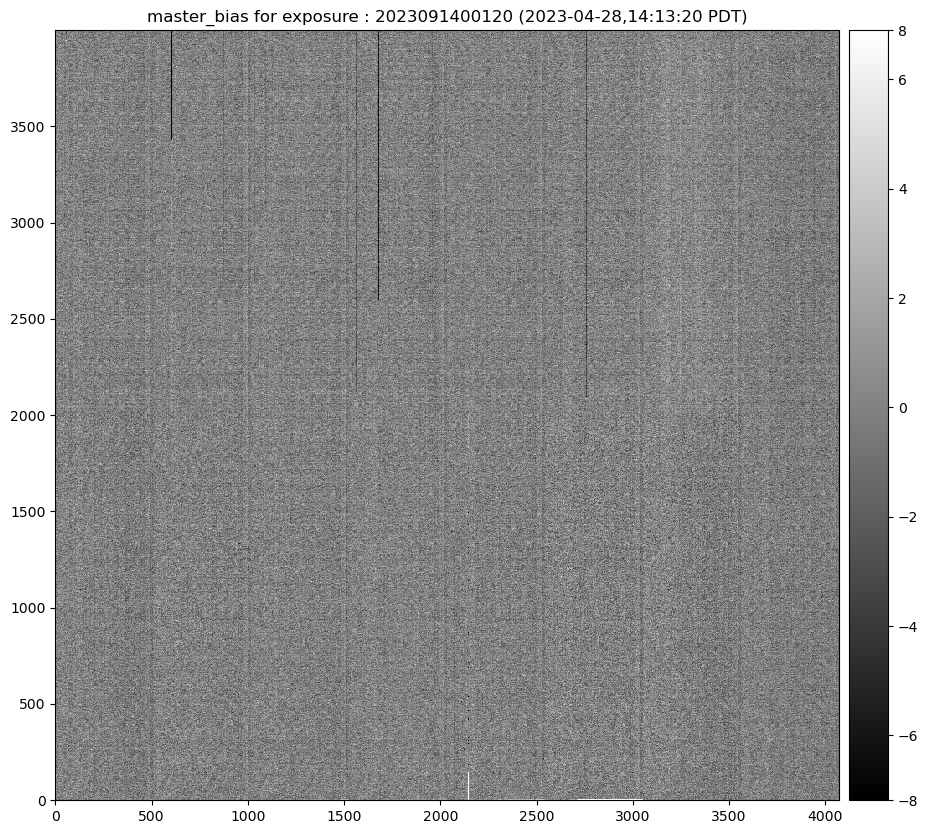

In [31]:
fig = plt.figure(figsize=(12,10))
afw_display = afwDisplay.Display(frame=fig)
afw_display.scale('linear', 'zscale',None)
title = f"master_bias for exposure : {exposure_selected} ({MB_date},{MB_time})"
afw_display.mtv(bias_img.image,title=title)

# Extract another way

Compare if we get different calibrations if we provide a sort list or a long list of Calib Collections

In [32]:
calibType = 'bias'
physical_filter = 'empty~empty'
cameraName = 'LATISS'

In [33]:
#print(all_calibcollections)
all_calibcollections.append('LATISS/raw/all')

In [34]:
small_calibcollection = ['LATISS/calib','LATISS/raw/all']
big_calibcollection = all_calibcollections

In [35]:
#print(big_calibcollection)

In [36]:
raw_img1= butler.get('raw', dataId={'exposure': exposure_selected, 'instrument': 'LATISS', 'detector': 0}, collections = small_calibcollection)
bias1 = butler.get("bias",instrument=cameraName, exposure= exposure_selected , detector=0, collections=small_calibcollection)
defects1 = butler.get('defects',instrument=cameraName, exposure= exposure_selected ,detector=0,collections=small_calibcollection)

In [37]:
raw_img2= butler.get('raw', dataId={'exposure': exposure_selected, 'instrument': 'LATISS', 'detector': 0}, collections = big_calibcollection)
bias2 = butler.get("bias",instrument=cameraName, exposure= exposure_selected , detector=0, collections=big_calibcollection)
defects2 = butler.get('defects',instrument=cameraName, exposure= exposure_selected ,detector=0,collections=big_calibcollection)

In [38]:
#bias_md2

In [39]:
bias_md1 = dict(bias1.getMetadata())
MB_date1= bias_md1['CALIB_CREATION_DATE']
MB_time1 = bias_md1['CALIB_CREATION_TIME']
bias_md2 = dict(bias2.getMetadata())
MB_date2= bias_md2['CALIB_CREATE_DATE']
MB_time2 = bias_md2['CALIB_CREATE_TIME']
print(f"Exposure {exposure_selected}, DATE for Master Bias with short calib list",MB_date1, MB_time1)
print(f"Exposure {exposure_selected}, DATE for Master Bias with full calib list",MB_date2, MB_time2)

Exposure 2023091400120, DATE for Master Bias with short calib list 2023-04-28 14:13:20 PDT
Exposure 2023091400120, DATE for Master Bias with full calib list 2022-10-05 17:03:47 PDT


Note that the Masterbias with the full calib list mode is very old (and the meta data name has changed). Thus one should always use the short list 

In [40]:
# Assembly task
# https://github.com/lsst/ip_isr/blob/main/python/lsst/ip/isr/isrTask.py

from lsst.ip.isr.assembleCcdTask import (AssembleCcdConfig, AssembleCcdTask)
from lsst.ip.isr.isrTask import (IsrTask, IsrTaskConfig)

#https://github.com/lsst/ip_isr/blob/main/python/lsst/ip/isr/overscan.py
from lsst.ip.isr import  OverscanCorrectionTaskConfig, OverscanCorrectionTask

In [41]:
isr_config =  IsrTaskConfig()
isr_config.doDark = False
isr_config.doFlat =  False
isr_config.doFringe = False
isr_config.doDefect = True
isr_config.doLinearize = False
isr_config.doCrosstalk =  False
isr_config.doSaturationInterpolation = False
isr_config.overscan.fitType: 'MEDIAN_PER_ROW'
isr_config.doBias: True
isr_task = IsrTask(config=isr_config)

In [42]:
#fast ISR 
isr1 = isr_task.run(raw_img1,bias=bias1,defects=defects1)
isr2 = isr_task.run(raw_img2,bias=bias2,defects=defects2)

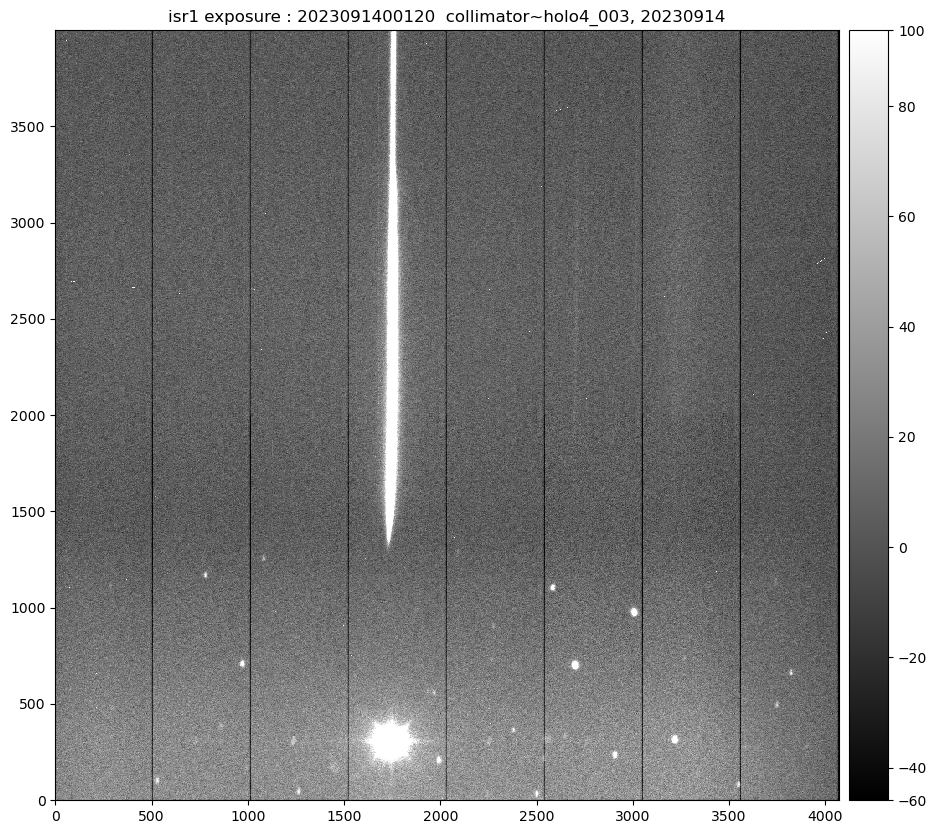

In [43]:
rotated1 = isr1.exposure.image.array[::-1,::-1] #rotate the array 180 degrees
#np.flip(np.flip(a, 1), 0)    
fig = plt.figure(figsize=(12,10))
afw_display = afwDisplay.Display(frame=fig)
afw_display.scale('linear', 'zscale',None)
the_title = f"isr1 exposure : {exposure_selected}  {filterdisperser}, {DATE}"
afw_display.mtv(isr1.exposure.image,title=the_title)

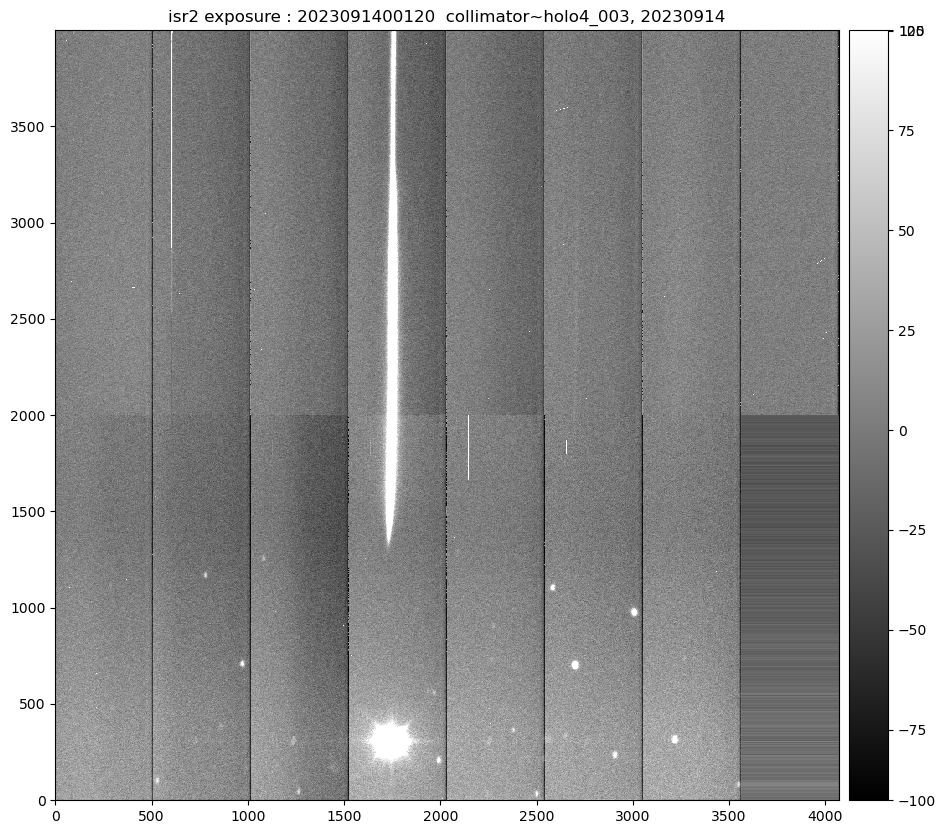

In [44]:
rotated2 = isr2.exposure.image.array[::-1,::-1] #rotate the array 180 degrees
#np.flip(np.flip(a, 1), 0)    
fig = plt.figure(figsize=(12,10))
afw_display = afwDisplay.Display(frame=fig)
afw_display.scale('linear', 'zscale',None)
the_title = f"isr2 exposure : {exposure_selected}  {filterdisperser}, {DATE}"
afw_display.mtv(isr2.exposure.image,title=the_title)

## So it is obvious that we should take the first method

In [45]:
raw = raw_img1
bias = bias1 
defects = defects1 

In [46]:
isr = isr_task.run(raw,bias=bias,defects=defects)

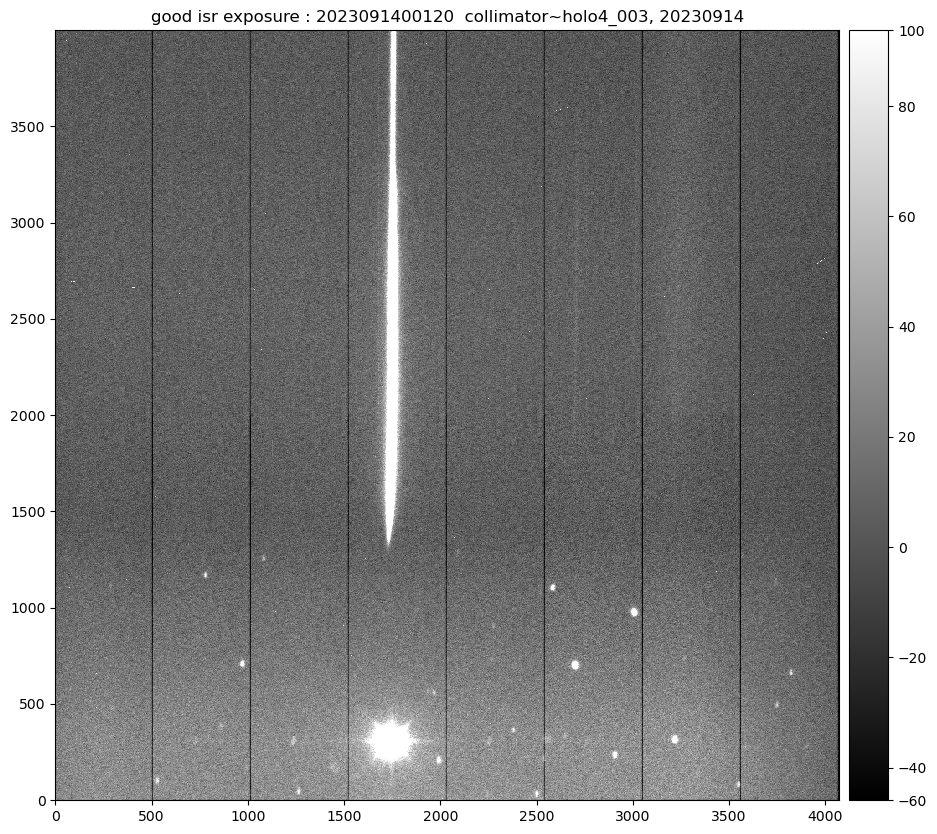

In [47]:
rotated = isr.exposure.image.array[::-1,::-1] #rotate the array 180 degrees
#np.flip(np.flip(a, 1), 0)    
fig = plt.figure(figsize=(12,10))
afw_display = afwDisplay.Display(frame=fig)
afw_display.scale('linear', 'zscale',None)
the_title = f"good isr exposure : {exposure_selected}  {filterdisperser}, {DATE}"
afw_display.mtv(isr1.exposure.image,title=the_title)

In [48]:
isr1.exposure.image.array.shape

(4000, 4072)

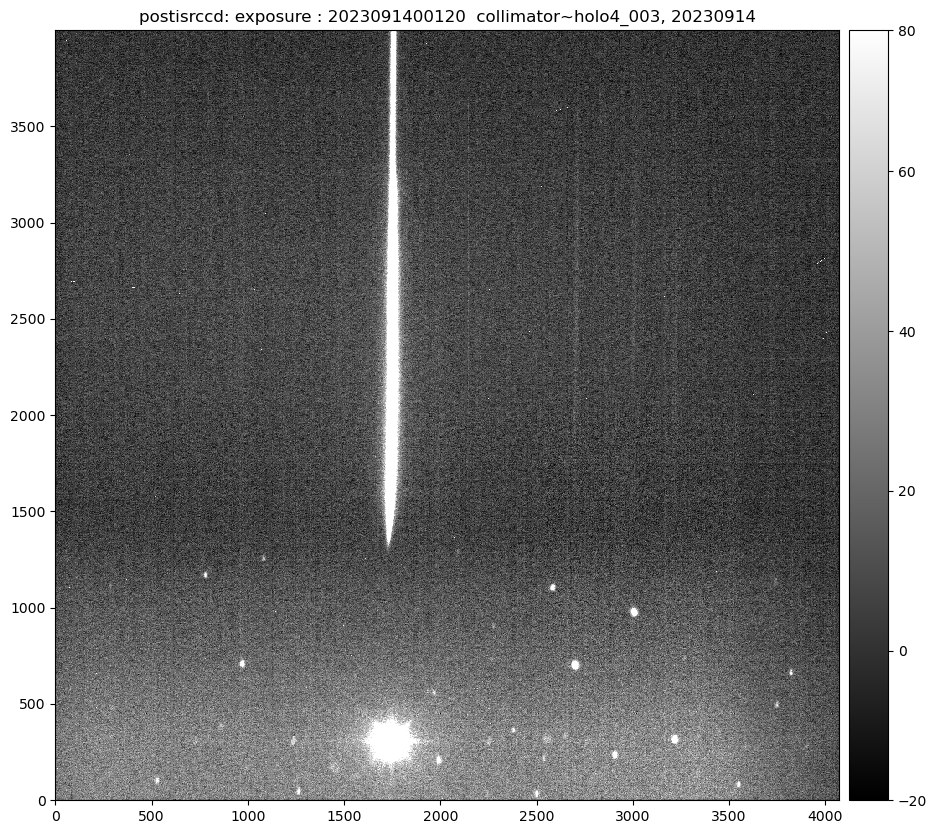

In [49]:
fig = plt.figure(figsize=(12,10))
afw_display = afwDisplay.Display(frame=fig)
afw_display.scale('linear', 'zscale',None)
the_title = f"postisrccd: exposure : {exposure_selected}  {filterdisperser}, {DATE}"
afw_display.mtv(postisrccd.image,title=the_title)

In [50]:
postisrccd.image.array.shape

(4000, 4072)

In [51]:
ratio = isr1.exposure.image.array/postisrccd.image.array

Text(0.5, 1.0, '(ratio my isr)/(dm postisrccd) for exposure 2023091400120  collimator~holo4_003, 20230914')

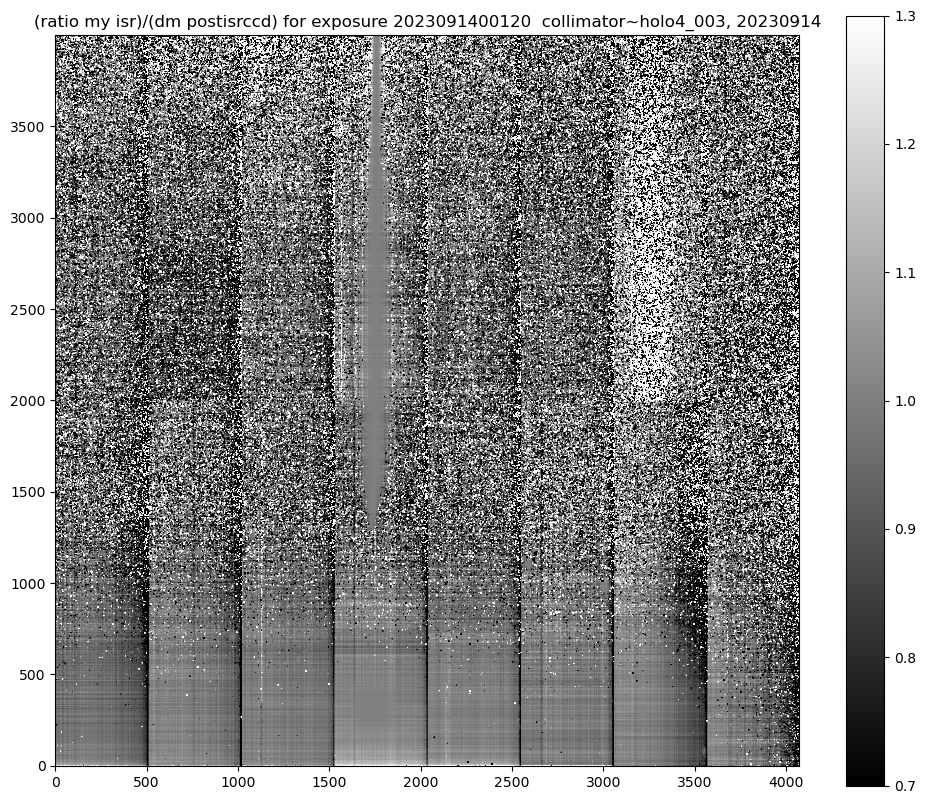

In [52]:
fig = plt.figure(figsize=(12,10))
im = plt.imshow(ratio,origin="lower",cmap="gray",vmin=0.7,vmax=1.3)
plt.colorbar(im)
the_title = f"(ratio my isr)/(dm postisrccd) for exposure {exposure_selected}  {filterdisperser}, {DATE}"
plt.title(the_title)

# Study sky background after ISR or PostISRCCD 

chose the one you want

In [53]:
isr_expo = postisrccd
isr_expo = isr.exposure

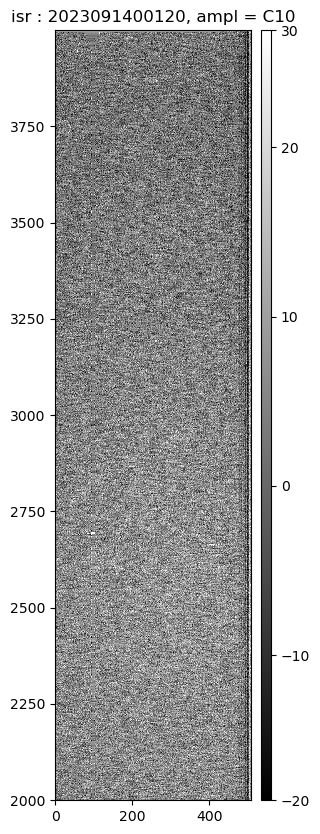

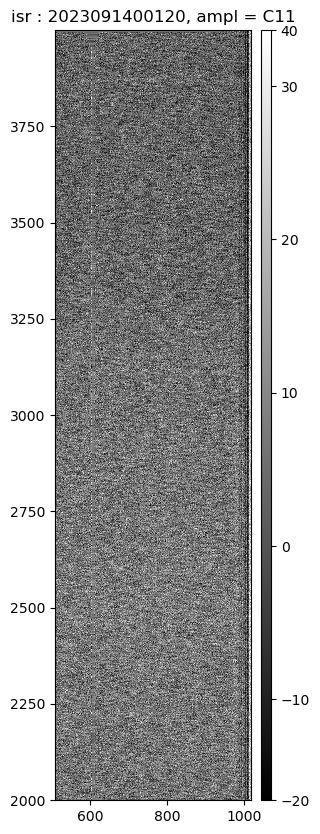

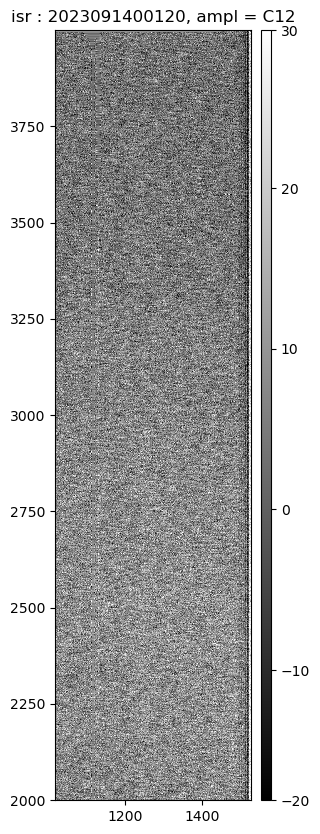

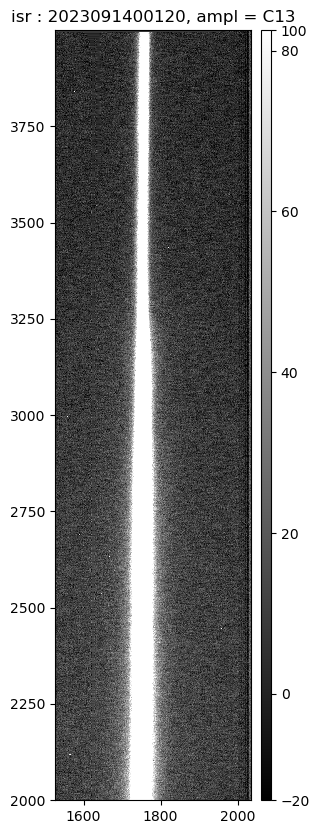

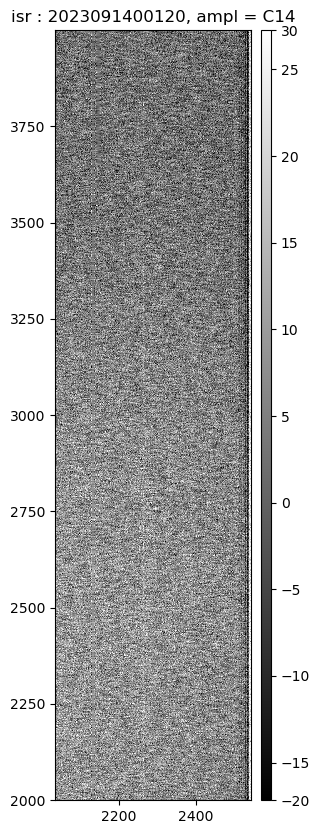

...

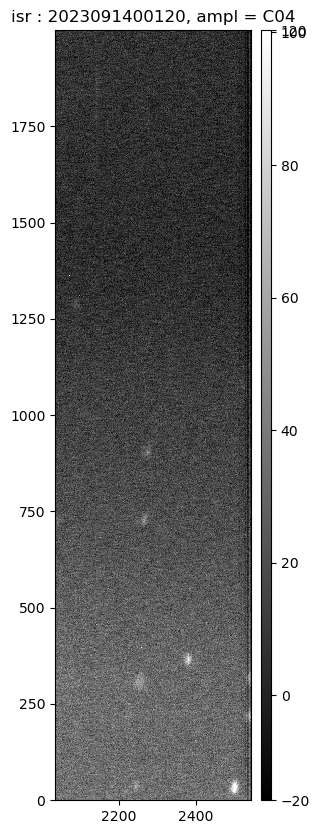

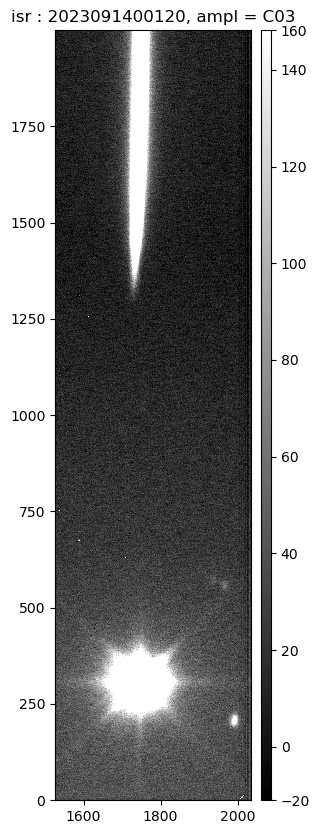

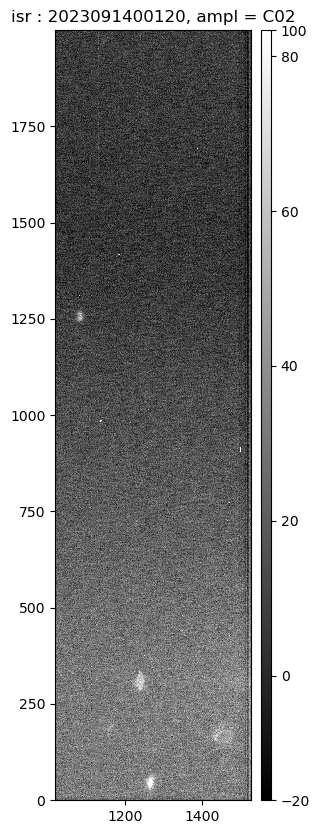

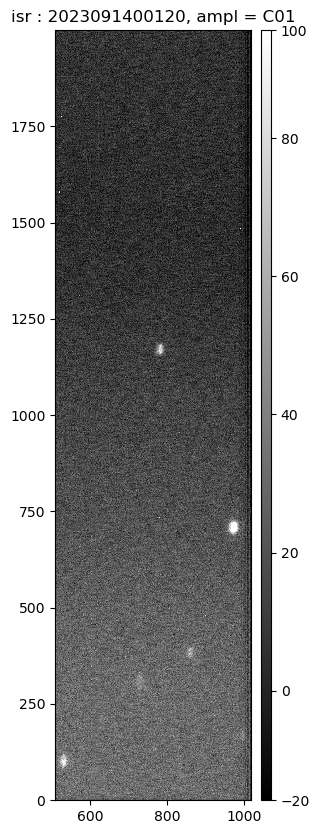

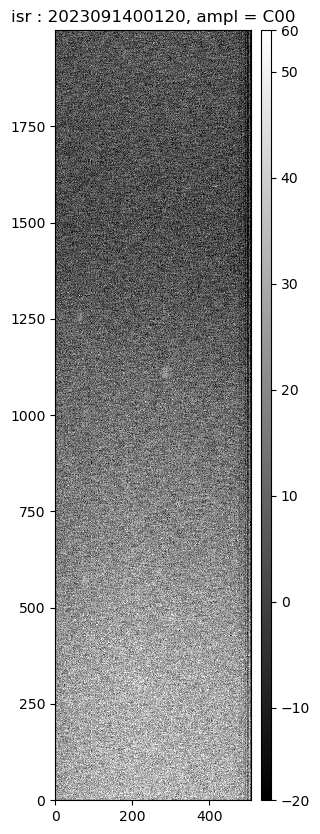

In [54]:
all_img = []
all_nameimg = []

for ampIdx, amp in enumerate(isr_expo.getDetector()):
    ampName = amp.getName()
    all_nameimg.append(ampName)
    
    # This can work only on postISRCCD
    ampExp = isr_expo.Factory(isr_expo, amp.getBBox())
    all_img.append(ampExp.image) 
    fig = plt.figure(figsize=(5,10))
    afw_display = afwDisplay.Display(frame=fig)
    afw_display.scale('linear', 'zscale',None)
    title = f"isr : {exposure_selected}, ampl = {ampName}"
    afw_display.mtv(ampExp.image,title=title)

In [55]:
mapampid = [0,1,2,3,4,5,6,7,15,14,13,12,11,10,9,8]

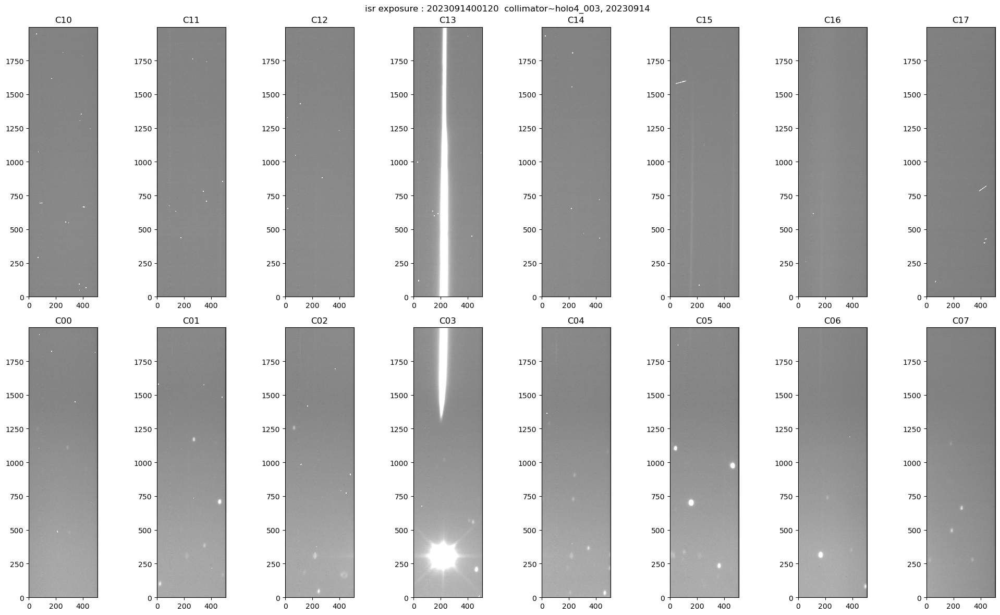

In [56]:
fig=plt.figure(figsize=(20,12))

for idx in range(16):
    ax=fig.add_subplot(2,8,mapampid[idx]+1)
    ax.imshow(all_img[idx].getArray(),origin='lower',vmin=-100,vmax=100,cmap="gray")
    ax.set_title(all_nameimg[idx])
the_title = f"isr exposure : {exposure_selected}  {filterdisperser}, {DATE}"
plt.suptitle(the_title)
plt.tight_layout()


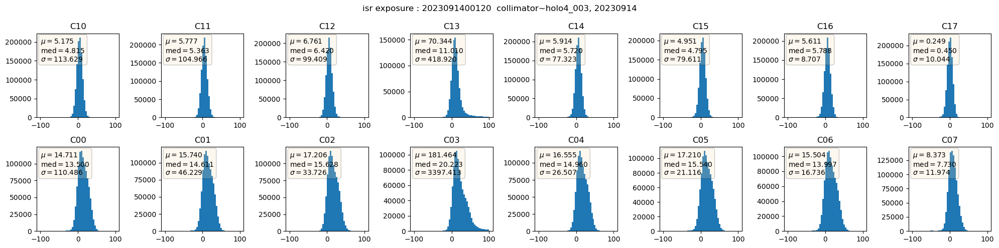

In [57]:
fig=plt.figure(figsize=(20,5))

for idx in range(16):
    ax=fig.add_subplot(2,8,mapampid[idx]+1)
    ax.hist(all_img[idx].getArray().flatten(),bins=50,range=(-100,100))
    x = all_img[idx].getArray().flatten()

    mu = x.mean()
    median = np.median(x)
    sigma = x.std()
    textstr = '\n'.join((
    r'$\mu=%.3f$' % (mu, ),
    r'$\mathrm{med}=%.3f$' % (median, ),
    r'$\sigma=%.3f$' % (sigma, )))

    ax.set_title(all_nameimg[idx])  
    props = dict(boxstyle='round', facecolor='wheat', alpha=0.2)

    # place a text box in upper left in axes coords
    ax.text(0.05, 0.95, textstr, transform=ax.transAxes, fontsize=10,verticalalignment='top', bbox=props)
    
the_title = f"isr exposure : {exposure_selected}  {filterdisperser}, {DATE}"
plt.suptitle(the_title)
plt.tight_layout()